In [ ]:
import geopandas as gpd
import pandas as pd


from shapely.ops import unary_union, linemerge
from shapely.geometry import Point, LineString, MultiLineString
from shapely.geometry import mapping


import networkx as nx


import folium
from folium import Map, GeoJson




### Berlin einlesen für Proof of concept

<Axes: >

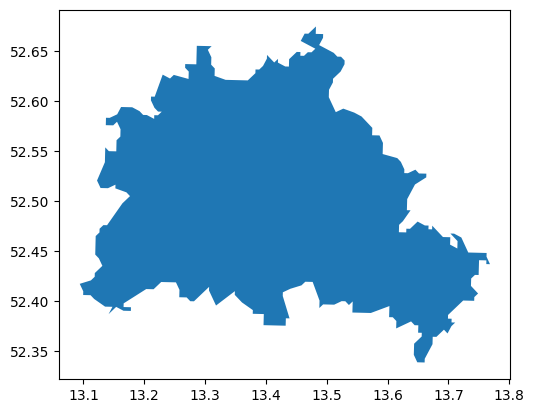

In [3]:
bland = gpd.read_file("https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/2_bundeslaender/1_sehr_hoch.geo.json")
bland_fil=bland[bland["id"].isin(["DE-BE"])]
bland_fil.plot()

### netzwerk einlesen

In [4]:
highways=gpd.read_file("../preprocessing/processed_osm_files/processed_major_highways_germany_250528.geojson.gz")

In [5]:
# set defaults
highways.loc[(highways["maxspeed"].isna() | (highways["maxspeed"] == "None")) & (highways["maxspeed_type"] == "DE:urban"), "maxspeed"] = "50"
highways.loc[(highways["maxspeed"].isna() | (highways["maxspeed"] == "None")) & (highways["maxspeed_type"] == "DE:rural"), "maxspeed"] = "100"
highways

,osm_id,highway,maxspeed,maxspeed_conditional,maxspeed_backward,maxspeed_forward,maxspeed_type,name,ref,geometry
0,99,tertiary,None,None,None,None,None,None,None,"LINESTRING (11.36639 48.17411, 11.36643 48.174..."
1,100,secondary,100,None,None,None,None,None,None,"LINESTRING (11.33037 48.1801, 11.33032 48.1801..."
2,122,secondary,50,None,None,None,None,Fritz-Foerster-Platz,S 172,"LINESTRING (13.73065 51.03015, 13.73085 51.03005)"
3,123,tertiary,50,None,None,None,None,Ackermannstraße,None,"LINESTRING (13.74848 51.0325, 13.74845 51.0324..."
4,680,motorway,none,None,None,None,None,None,A 99,"LINESTRING (11.54134 48.22607, 11.54283 48.22619)"
...,...,...,...,...,...,...,...,...,...,...
1388444,1390543898,tertiary,70,None,None,None,sign,Kanalstraße,K 12,"LINESTRING (10.38261 52.15137, 10.38258 52.151..."
1388445,1390543899,tertiary,50,None,None,None,None,Kanalstraße,K 13,"LINESTRING (10.37603 52.15709, 10.37671 52.15726)"
1388446,1390543900,tertiary,50,None,None,None,None,Kanalstraße,K 13,"LINESTRING (10.37732 52.15743, 10.37806 52.15762)"
1388447,1390543901,tertiary,100,None,None,None,None,Kanalstraße,K 13,"LINESTRING (10.35426 52.15589, 10.3531 52.1559..."


In [6]:
## nur Berlin
highways_in_bl = gpd.clip(highways, bland_fil)
highways_in_bl

,osm_id,highway,maxspeed,maxspeed_conditional,maxspeed_backward,maxspeed_forward,maxspeed_type,name,ref,geometry
489036,152597085,tertiary,50,None,None,None,None,Schichauweg,None,"LINESTRING (13.38193 52.39706, 13.38197 52.397..."
1376117,1365817317,tertiary,50,None,None,None,None,Motzener Straße,None,"LINESTRING (13.38189 52.39724, 13.38189 52.397..."
1005437,589691158,tertiary,30,None,None,None,None,Barnetstraße,None,"LINESTRING (13.39264 52.39826, 13.39247 52.398..."
27475,5110892,tertiary,50,None,None,None,None,Barnetstraße,None,"LINESTRING (13.38901 52.39846, 13.38916 52.398..."
252910,37910150,tertiary,50,None,None,None,None,Barnetstraße,None,"LINESTRING (13.38925 52.39856, 13.38922 52.398..."
...,...,...,...,...,...,...,...,...,...,...
603753,221381131,secondary,50,None,None,None,None,Heiligenseestraße,None,"LINESTRING (13.23055 52.60626, 13.23043 52.606..."
664527,254415330,secondary,50,None,None,None,None,Heiligenseestraße,None,"LINESTRING (13.22982 52.60658, 13.22971 52.606..."
611576,225597268,secondary,50,None,None,None,None,Heiligenseestraße,None,"LINESTRING (13.22917 52.60671, 13.22902 52.606..."
603754,221381132,secondary,50,None,None,None,None,Heiligenseestraße,None,"LINESTRING (13.22839 52.60684, 13.22757 52.60697)"


<Axes: >

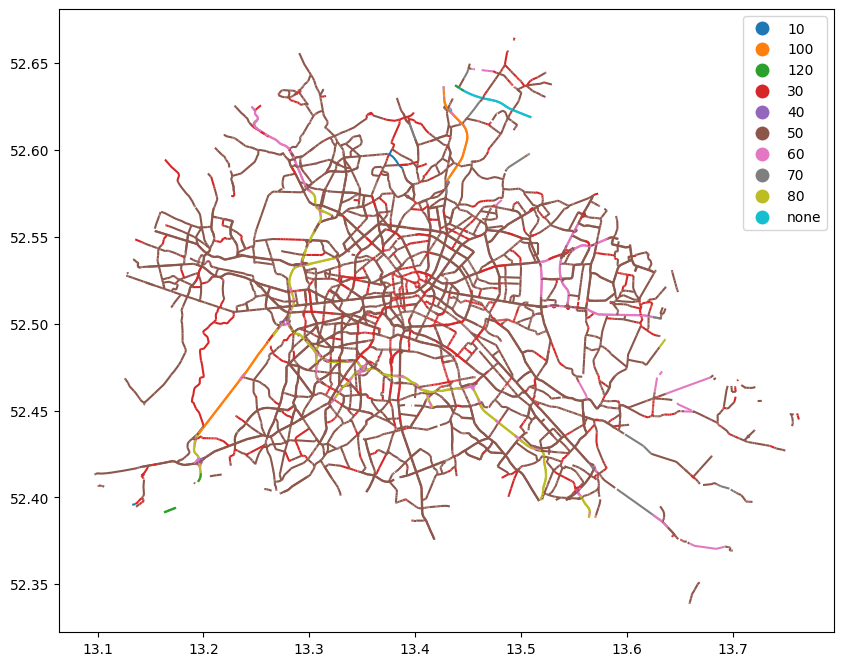

In [7]:
highways_in_bl.plot(column="maxspeed", legend=True, figsize=(10, 10))

<Axes: >

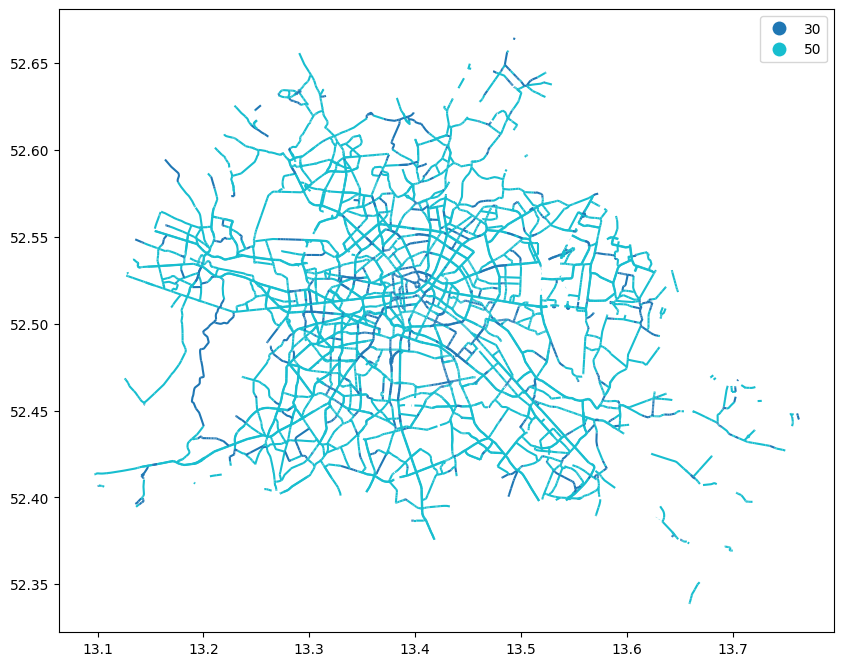

In [8]:
#nur 30 und 50 km/h

highways_in_bl_3050=highways_in_bl[highways_in_bl.maxspeed.isin(["30", "50"])].copy()
highways_in_bl_3050.plot(column="maxspeed", legend=True, figsize=(10, 10))

In [112]:
### dissolve nach "maxspeed", "maxspeed_conditional", "name", wenn sich geometrien berühren


def dissolve_touching_segments(gdf, group_cols, crs=None):
    """
    Führt ein topologisch korrektes dissolve durch:
    - Nur Geometrien mit denselben Attributwerten (laut `group_cols`) werden berücksichtigt.
    - Innerhalb jeder Gruppe werden nur geometrisch verbundene Linien (touch/intersect) verschmolzen.

    Parameter:
    ----------
    gdf : GeoDataFrame
        Die Eingabedaten (z. B. Straßenabschnitte).
    group_cols : list of str
        Spaltennamen, nach denen gruppiert werden soll (z. B. ["maxspeed", "name"]).
    crs : optional
        Falls angegeben, wird das Ergebnis in dieses CRS transformiert.

    Rückgabe:
    --------
    GeoDataFrame
        Dissolving-Ergebnis mit zusammengefassten Geometrien.
    """
    df = gdf.copy()

    # Temporäre Platzhalter für NaNs
    for col in group_cols:
        df[col] = df[col].fillna("__NA__")

    dissolved_parts = []

    for _, group in df.groupby(group_cols):
        group = group.reset_index(drop=True)

        # Graph aufbauen: Knoten = Zeilen, Kante = wenn Geometrien sich berühren
        G = nx.Graph()
        for i, geom1 in enumerate(group.geometry):
            G.add_node(i)
            for j in range(i + 1, len(group)):
                geom2 = group.geometry.iloc[j]
                if geom1.touches(geom2) or geom1.intersects(geom2):
                    G.add_edge(i, j)

        # Verbundene Komponenten (connected lines) mergen
        for component in nx.connected_components(G):
            sub_geom = group.geometry.iloc[list(component)]
            unioned = unary_union(sub_geom)

            if isinstance(unioned, LineString):
                merged = unioned
            elif isinstance(unioned, MultiLineString):
                merged = linemerge(unioned)
            else:
                continue

            row = {col: (None if group[col].iloc[0] == "__NA__" else group[col].iloc[0]) for col in group_cols}
            row["geometry"] = merged
            dissolved_parts.append(row)

    result = gpd.GeoDataFrame(dissolved_parts, crs=gdf.crs)

    if crs:
        result = result.to_crs(crs)

    return result


In [113]:
highways_in_bl_3050_diss = dissolve_touching_segments(
    highways_in_bl_3050,
    group_cols=["maxspeed", "maxspeed_conditional", "name"]
)

In [129]:
from tqdm import tqdm
import geopandas as gpd
import networkx as nx
from shapely.geometry import LineString, MultiLineString
from shapely.ops import linemerge, unary_union

def dissolve_touching_segments_sjoin(gdf, group_cols, crs=None):
    df = gdf.copy()
    for col in group_cols:
        df[col] = df[col].fillna("__NA__")

    results = []

    group_iter = df.groupby(group_cols)
    for key, group in tqdm(group_iter, total=len(group_iter), desc="Gruppen verarbeiten"):
        if len(group) == 0:
            continue

        # Spatial Join innerhalb der Gruppe
        joined = gpd.sjoin(group, group, predicate="intersects", how="left")

        # Netzwerkgraph mit Original-Indices
        G = nx.Graph()
        G.add_nodes_from(group.index)

        for _, row in joined.iterrows():
            i = row.name            # linker Index (von group)
            j = row["index_right"]  # rechter Index
            if i != j:
                G.add_edge(i, j)

        for component in nx.connected_components(G):
            lines = df.loc[list(component)].geometry
            unioned = unary_union(lines)

            if isinstance(unioned, LineString):
                merged = unioned
            elif isinstance(unioned, MultiLineString):
                merged = linemerge(unioned)
            else:
                continue

            row = {col: None if val == "__NA__" else val for col, val in zip(group_cols, key)}
            row["geometry"] = merged
            results.append(row)

    return gpd.GeoDataFrame(results, crs=gdf.crs if crs is None else crs)


In [130]:
# Vorher in metrisches CRS
gdf_m = highways_in_bl_3050.to_crs(25832)

dissolved = dissolve_touching_segments_sjoin(
    gdf_m,
    group_cols=["maxspeed", "maxspeed_conditional", "name"]
)

print("Vorher:", len(gdf_m))
print("Nachher:", len(dissolved))


Gruppen verarbeiten: 100%|██████████| 2010/2010 [00:06<00:00, 333.26it/s]

Vorher: 22019
Nachher: 3540


In [134]:
# für die Länge in Metern zu den dissolved Linien
highways_in_bl_3050_diss_m = highways_in_bl_3050_diss.to_crs(25833).copy()
highways_in_bl_3050_diss_m["length_m"] = highways_in_bl_3050_diss_m.geometry.length
highways_in_bl_3050_diss_m


,maxspeed,maxspeed_conditional,name,geometry,length_m
0,30,30 @ (07:00-18:00),Hauptstraße,"LINESTRING (389492.144 5827684.945, 389488.417...",244.285425
1,30,30 @ (07:00-20:00),Lindenstraße,"LINESTRING (391031.273 5818108.483, 391032.174...",75.790513
2,30,30 @ (22:00-06:00),Grazer Damm,"LINESTRING (387773.575 5813820.449, 387773.994...",224.735468
3,30,30 @ (22:00-06:00),Grazer Damm,"LINESTRING (387797.746 5813596.684, 387797.095...",224.746719
4,30,30 @ (22:00-06:00),Markgrafendamm,"LINESTRING (395827.848 5817599.881, 395832.665...",161.539329
...,...,...,...,...,...
3535,50,None,None,"LINESTRING (381558.49 5831099.849, 381465.27 5...",371.992669
3536,50,None,None,"MULTILINESTRING ((393694.969 5831483.269, 3936...",449.704626
3537,50,None,None,"LINESTRING (393827.971 5831644.272, 393834.151...",96.563308
3538,50,None,None,"LINESTRING (385830.337 5832918.106, 385839.984...",32.916516


In [135]:
# Finde alle kurzen Tempo-50-Straßenabschnitte (< 400 m), die an beiden Enden jeweils genau ein Tempo-30-Segment berühren.
# Diese Abschnitte könnten z. B. Verbindungsstücke zwischen zwei 30er-Zonen sein.



def find_short_50_segments_between_30_zones(gdf, length_threshold=400, buffer_dist=0.1):
    """
    Findet kurze Tempo-50-Straßenabschnitte, die an beiden Enden jeweils genau
    ein (verschiedenes) Tempo-30-Segment berühren.

    Diese Segmente könnten Verbindungselemente zwischen zwei 30er-Zonen sein.

    Parameter:
    ----------
    gdf : GeoDataFrame
        Straßensegmente mit mind. den Spalten 'maxspeed', 'geometry', 'length_m'
    length_threshold : float
        Maximale Länge (in Metern), um als "kurz" zu gelten (Standard: 400)
    buffer_dist : float
        Puffer um Start- und Endpunkte für Intersektion (in CRS-Einheit, z. B. Meter)

    Rückgabe:
    --------
    GeoDataFrame mit passenden 50er-Segmenten
    """

    # Schritt 1: Kurze 50er-Segmente
    gdf_50_kurz = gdf[(gdf["maxspeed"] == "50") & (gdf["length_m"] < length_threshold)]

    # Schritt 2: Alle 30er-Segmente
    gdf_30 = gdf[gdf["maxspeed"] == "30"]

    valid_indices = []

    #for idx, row in gdf_50_kurz.iterrows():
    for idx, row in tqdm(gdf_50_kurz.iterrows(), total=len(gdf_50_kurz), desc="Suche kurze 50er-Segmente"):
        geom = row.geometry

        # Start- und Endpunkte extrahieren
        if isinstance(geom, MultiLineString):
            lines = list(geom.geoms)
            if not lines:
                continue
            start_point = Point(lines[0].coords[0])
            end_point = Point(lines[-1].coords[-1])
        elif isinstance(geom, LineString):
            start_point = Point(geom.coords[0])
            end_point = Point(geom.coords[-1])
        else:
            continue

        # Puffer um die Punkte
        start_buffer = start_point.buffer(buffer_dist)
        end_buffer = end_point.buffer(buffer_dist)

        # Prüfen, ob genau ein 30er-Segment Start und Ende jeweils berührt
        start_hits = gdf_30[gdf_30.geometry.intersects(start_buffer)]
        end_hits = gdf_30[gdf_30.geometry.intersects(end_buffer)]

        if len(start_hits) == 1 and len(end_hits) == 1:
            if start_hits.index[0] != end_hits.index[0]:
                valid_indices.append(idx)

    return gdf_50_kurz.loc[valid_indices]


In [136]:
kurz_mit_zwei_30 = find_short_50_segments_between_30_zones(highways_in_bl_3050_diss_m)

Suche kurze 50er-Segmente: 100%|██████████| 1734/1734 [00:01<00:00, 1291.90it/s]


In [15]:
#kurz_mit_zwei_30.plot()
kurz_mit_zwei_30.explore(tiles="CartoDB positron")

### Darstellung zusammen mit anderen Geschwindigkeitsabschnitten:

In [ ]:


# Karte initialisieren
m = folium.Map(
    location=[52.52, 13.405],
    tiles='CartoDB positron',
    zoom_start=12
)

highways_in_bl_3050_diss_m_4326=highways_in_bl_3050_diss_m.to_crs(4326)  # Stelle sicher, dass die Geometrien in einem metrischen CRS sind


# 1. Kombiniere Farbe + Dash-Stil zu einem gemeinsamen Schlüssel
def style_key(row):
    base = row["maxspeed"]
    if isinstance(row["maxspeed_conditional"], str) and row["maxspeed_conditional"].strip().startswith("30 @"):
        return f"{base}_dashed"
    else:
        return f"{base}_solid"

highways_in_bl_3050_diss_m_4326["style_key"] = highways_in_bl_3050_diss_m_4326.apply(style_key, axis=1)

# 2. Definiere Farben und DashArrays pro Stil
style_map = {
    "30_solid": {"color": "green", "dashArray": "none"},
    "30_dashed": {"color": "green", "dashArray": "5, 5"},
    "50_solid": {"color": "orange", "dashArray": "none"},
    "50_dashed": {"color": "orange", "dashArray": "5, 5"},
}

# Linien hinzufügen mit Stil
for _, row in highways_in_bl_3050_diss_m_4326.iterrows():
    style = style_map.get(row["style_key"], {"color": "gray", "dashArray": "none"})
    
    feature = {
        "type": "Feature",
        "geometry": mapping(row.geometry),
        "properties": {
            "maxspeed": row.get("maxspeed", ""),
            "maxspeed_conditional": row.get("maxspeed_conditional", ""),
            "name": row.get("name", "")
        }
    }

    folium.GeoJson(
        data=feature,
        style_function=lambda feature, s=style: {
            "color": s["color"],
            "weight": 3,
            "dashArray": s["dashArray"]
        },
        tooltip=folium.GeoJsonTooltip(
            fields=["maxspeed", "maxspeed_conditional", "name"],
            aliases=["Maxspeed", "Conditional", "Name"],
            sticky=True
        )
    ).add_to(m)

# Legend hinzufügen (HTML)
legend_html = """
<div style="
    position: fixed;
    bottom: 30px;
    left: 30px;
    width: 250px;
    height: 180px;
    background-color: white;
    border:2px solid grey;
    z-index:9999;
    font-size:14px;
    padding: 10px;
    box-shadow: 2px 2px 6px rgba(0,0,0,0.3);
">
<b>Legende</b><br>
<span style="color:green;">▇</span> 30 km/h<br>
<span style="color:green;">▱▱▱</span> 30 km/h (bed. 30km/h, eigentlich unsinnig)<br>
<span style="color:orange;">▇</span> 50 km/h<br>
<span style="color:orange;">▱▱▱</span> 50 km/h (bed. 30km/h)<br>
<span style="color:red;">▇</span> kurzer 50 km/h Abschnitt zw. zwei 30km/h<br>

</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))

kurz_mit_zwei_30.explore(
    m=m,
    style_kwds=dict(color="red", weight=6),
    name="Kurz mit zwei 30er"
)

m


In [39]:
kurz_mit_zwei_30

,maxspeed,maxspeed_conditional,name,geometry,length_m
779,50,30 @ (22:00-06:00),Gehsener Straße,"LINESTRING (403259.672 5813877.505, 403252.408...",100.370108
795,50,30 @ (22:00-06:00),Hertastraße,"LINESTRING (393538.926 5813878.488, 393550.014...",308.735343
835,50,30 @ (22:00-06:00),Müggelseedamm,"LINESTRING (406350.537 5811596.745, 406354.647...",148.548220
837,50,30 @ (22:00-06:00),Neumannstraße,"LINESTRING (393153.637 5823696.602, 393152.606...",253.792806
877,50,30 @ (22:00-06:00),Schönhauser Straße,"LINESTRING (390196.658 5829045.766, 390198.398...",300.060903
...,...,...,...,...,...
3449,50,None,None,"LINESTRING (392521.486 5820854.437, 392520.226...",34.053984
3456,50,None,None,"LINESTRING (388885.275 5822125.663, 388879.002...",10.315041
3481,50,None,None,"LINESTRING (390600.239 5823389.029, 390591.391...",12.776049
3483,50,None,None,"LINESTRING (390259.457 5823689.077, 390270.374...",15.281386


## Production for Germany

In [21]:
highways_3050=highways[highways.maxspeed.isin(["30", "50"])].copy()


In [ ]:

# this takes some time ~3 minutes
highways_3050_diss = dissolve_touching_segments_sjoin(
    highways_3050,
    group_cols=["maxspeed", "maxspeed_conditional", "name"]
)

Gruppen verarbeiten: 100%|██████████| 59041/59041 [03:08<00:00, 313.12it/s]


In [132]:
# # this takes some time ~15 minutes
# highways_3050_diss = dissolve_touching_segments(
#     highways_3050,
#     group_cols=["maxspeed", "maxspeed_conditional", "name"]
# )

In [133]:
# für die Länge in Metern zu den dissolved Linien
highways_3050_diss_m = highways_3050_diss.to_crs(25833).copy()
highways_3050_diss_m["length_m"] = highways_3050_diss_m.geometry.length
highways_3050_diss_m

,maxspeed,maxspeed_conditional,name,geometry,length_m
0,30,10 (2020 January 1-2025 March 30),Otterberger Straße,"LINESTRING (-24349.699 5503914.364, -24357.336...",63.470229
1,30,10 @ (2020 January 1-2025 March 30),Morlauterer Straße,"LINESTRING (-24347.967 5503807.967, -24355.337...",46.054057
2,30,10 @ (weight > 3.5),Bahnhofstraße,"LINESTRING (354617.498 5904923.624, 354615.559...",328.098051
3,30,20 @ (maxweight >3.5),Leerer Landstraße,"LINESTRING (3356.602 5940914.594, 3311.006 594...",671.461776
4,30,"30 @ (00:00-06:00,22:00-24:00)",Benzhauser Straße,"LINESTRING (-36335.22 5349170.896, -36326.939 ...",228.640162
...,...,...,...,...,...
162227,50,None,Československých letců,"LINESTRING (473456.006 5637814.605, 473444.684...",1590.239256
162228,50,None,Žitavská,"LINESTRING (475403.979 5639286.817, 475402.829...",1546.428658
162229,50,maxspeed:conditional=30 @ (22:00-06:00),Dottendorfer Straße,"LINESTRING (-56350.366 5646718.009, -56312.477...",155.735876
162230,50,maxspeed:conditional=30 @ (Mo-Fr 07:00-17:00),Lindenstraße,"LINESTRING (-21426.926 5777458.392, -21352.903...",206.704749


In [150]:
kurz_mit_zwei_30_ger = find_short_50_segments_between_30_zones(highways_3050_diss_m)
kurz_mit_zwei_30_ger

Suche kurze 50er-Segmente:   0%|          | 0/81387 [00:00<?, ?it/s]

Suche kurze 50er-Segmente: 100%|██████████| 81387/81387 [03:53<00:00, 348.17it/s]


,maxspeed,maxspeed_conditional,name,geometry,length_m
22583,50,"30 @ (00:00-06:00,22:00-24:00)",Lange Straße,"LINESTRING (-23998.362 5350747.294, -23995.464...",4.321263
22767,50,30 @ (06:00-20:00),Warbruckstraße,"LINESTRING (-70794.436 5738996.051, -70815.389...",337.487476
22997,50,30 @ (07:00-18:00),Kühnichter Straße,"LINESTRING (449632.45 5699393.14, 449648.661 5...",110.409052
23379,50,30 @ (22:00-06:00),Calwer Straße,"LINESTRING (38468.346 5434027.278, 38439.974 5...",254.645035
23384,50,30 @ (22:00-06:00),Charlottenstraße,"LINESTRING (79689.839 5436567.071, 79699.7 543...",96.717072
...,...,...,...,...,...
159322,50,None,None,"LINESTRING (-71993.35 5730003.293, -71997.49 5...",20.147621
159402,50,None,None,"LINESTRING (44681.454 5544917.288, 44682.055 5...",26.375373
159520,50,None,None,"LINESTRING (-10666.286 5696768.484, -10657.595...",104.467364
160284,50,None,None,"LINESTRING (254935.912 5459338.766, 254958.705...",45.042817


In [151]:
kurz_mit_zwei_30_ger.crs

<Projected CRS: EPSG:25833>
Name: ETRS89 / UTM zone 33N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 12°E and 18°E: Austria; Croatia; Denmark - offshore and offshore; Germany - onshore and offshore; Italy - onshore and offshore; Norway including Svalbard - onshore and offshore.
- bounds: (12.0, 34.79, 18.01, 84.01)
Coordinate Operation:
- name: UTM zone 33N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [152]:
kurz_mit_zwei_30_poly=kurz_mit_zwei_30_ger.copy()
kurz_mit_zwei_30_poly["geometry"]=kurz_mit_zwei_30_ger.buffer(10)

In [153]:
kurz_mit_zwei_30_poly=kurz_mit_zwei_30_poly.to_crs(4326).copy()

In [154]:
kurz_mit_zwei_30_poly

,maxspeed,maxspeed_conditional,name,geometry,length_m
22583,50,"30 @ (00:00-06:00,22:00-24:00)",Lange Straße,"POLYGON ((7.96069 48.09396, 7.9607 48.09396, 7...",4.321263
22767,50,30 @ (06:00-20:00),Warbruckstraße,"POLYGON ((6.7679 51.51219, 6.76756 51.51209, 6...",337.487476
22997,50,30 @ (07:00-18:00),Kühnichter Straße,"POLYGON ((14.27544 51.44363, 14.27566 51.4437,...",110.409052
23379,50,30 @ (22:00-06:00),Calwer Straße,"POLYGON ((8.70218 48.88669, 8.7021 48.88666, 8...",254.645035
23384,50,30 @ (22:00-06:00),Charlottenstraße,"POLYGON ((9.25928 48.93905, 9.25935 48.9391, 9...",96.717072
...,...,...,...,...,...
159322,50,None,None,"POLYGON ((6.76533 51.43125, 6.76533 51.43126, ...",20.147621
159402,50,None,None,"POLYGON ((8.65999 49.88303, 8.66003 49.88301, ...",26.375373
159520,50,None,None,"POLYGON ((7.6877 51.19338, 7.6879 51.19357, 7....",104.467364
160284,50,None,None,"POLYGON ((11.63358 49.2376, 11.63372 49.23753,...",45.042817


In [155]:
kurz_mit_zwei_30_poly.to_file("scenario3_tempo30_conti_polys.fgb", driver="FlatGeobuf")

In [156]:
kurz_mit_zwei_30_centroids_gdf = kurz_mit_zwei_30_poly.copy()
kurz_mit_zwei_30_centroids_gdf=kurz_mit_zwei_30_centroids_gdf.to_crs(25832)
kurz_mit_zwei_30_centroids_gdf["geometry"] = kurz_mit_zwei_30_centroids_gdf.geometry.centroid
kurz_mit_zwei_30_centroids_gdf=kurz_mit_zwei_30_centroids_gdf.to_crs(4326)

kurz_mit_zwei_30_centroids_gdf

,maxspeed,maxspeed_conditional,name,geometry,length_m
22583,50,"30 @ (00:00-06:00,22:00-24:00)",Lange Straße,POINT (7.96078 48.09389),4.321263
22767,50,30 @ (06:00-20:00),Warbruckstraße,POINT (6.76595 51.51171),337.487476
22997,50,30 @ (07:00-18:00),Kühnichter Straße,POINT (14.27595 51.44373),110.409052
23379,50,30 @ (22:00-06:00),Calwer Straße,POINT (8.70102 48.8863),254.645035
23384,50,30 @ (22:00-06:00),Charlottenstraße,POINT (9.2596 48.93927),96.717072
...,...,...,...,...,...
159322,50,None,None,POINT (6.76551 51.43119),20.147621
159402,50,None,None,POINT (8.66007 49.88288),26.375373
159520,50,None,None,POINT (7.68821 51.19356),104.467364
160284,50,None,None,POINT (11.6334 49.23758),45.042817


In [157]:
kurz_mit_zwei_30_centroids_gdf.to_file("scenario3_tempo30_conti_points.fgb", driver="FlatGeobuf")

In [160]:
def fgb_to_pmtiles_dual_layer(points_fgb, polys_fgb, output_pmtiles):
    import subprocess
    from pathlib import Path

    tmp_points = "tmp_points.pmtiles"
    tmp_polys = "tmp_polys.pmtiles"

    subprocess.run([
        "tippecanoe", "-o", tmp_points,
        "--layer=scenario3-points",
        "--minimum-zoom=6", "--maximum-zoom=14",
        "--force",
        "--no-feature-limit", "--no-tile-size-limit", "--force-feature-limit",
        "--drop-densest-as-needed",
        "--drop-rate=0",
        str(Path(points_fgb).resolve())
    ], check=True)

    subprocess.run([
        "tippecanoe", "-o", tmp_polys,
        "--layer=scenario3-polys",
        "--minimum-zoom=14", "--maximum-zoom=15",
        "--force",
        "--no-feature-limit", "--no-tile-size-limit", "--force-feature-limit",
        str(Path(polys_fgb).resolve())
    ], check=True)

    subprocess.run([
        "tile-join", "--force", "-o", str(Path(output_pmtiles).resolve()),
        tmp_points, tmp_polys
    ], check=True)

    print("✅ Combined PMTiles created")


In [161]:
fgb_to_pmtiles_dual_layer(
    points_fgb="scenario3_tempo30_conti_points.fgb",
    polys_fgb="scenario3_tempo30_conti_polys.fgb",
    output_pmtiles="scenario3_tempo30_conti.pmtiles"
    )

detected indexed FlatGeobuf: assigning feature IDs by sequence
1052 features, 38505 bytes of geometry and attributes, 36946 bytes of string pool, 0 bytes of vertices, 0 bytes of nodes
  99.9%  14/8804/5376  
detected indexed FlatGeobuf: assigning feature IDs by sequence
1052 features, 310544 bytes of geometry and attributes, 36946 bytes of string pool, 0 bytes of vertices, 0 bytes of nodes
  99.9%  15/17156/11185  


✅ Combined PMTiles created
